## COVID-19 in Nigeria: Rural-urban Socio-economic Implications

This project is part of a Capstone Project conducted to fulfil the requirements for completing the Coursera-IBM Data Science Professional Certificate Progam.

The COVID-19 pandemic has had varying impacts on countries, and on regions within each Country. Nigeria is no exception. The pandemic - infections, testing, deaths - has exposed some of the pre-existing disparities in both social and economic factors, some of which have accentuated the differences in the severity of the impact from region to region. While some governments are aware of some of these disparities and their effects on the severity of the pandemic, many governments are met with the current challenge of dealing with response to the virus in real-time, with little effort or resources to spare in a more wholistic view of the challenge for a more coordinated response. Furthermore, a better understanding of this wholistic view vis-a-vis socio-economic indicators, will help the Nigerian government better prepare for whatever future pandemics or epidemics may occur.

Population density, access to healthcare facilities, and the economic wherewhital to ride such a disruptive event, are some of the factors that will be explored in this project.  Data will be accessed from the Nigeria Bureau of Statistics. 

The data will comprise:

a. Population Density in Nigeria by State

b. Consumer Price Index by State

c. Unemployment Data by State

d. COVID-19 latest Data by State

Foursquare location data will be utilized to assess availability of healthcare services in specific cities and neighbourhoods. The information from Foursquare will be juxtaposed with the COVID-19 data and other data sets to assess its effects on pandemic severity. Where data is sparse via Foursquare location data, other location data sources will be utilized.

Ultimately, the government of Nigeria, both at the National and State level, should find this assessment useful for planning and implementation, and for better preparedness for future public health crises that may occur.

In [241]:
# IMPORTING REQUIRED LIBRARIES
import numpy as np
import pandas as pd

!pip install geopy
from geopy.geocoders import Nominatim

!pip install folium==0.5.0
import folium

import json
from pandas.io.json import json_normalize

import requests

import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.datasets.samples_generator import make_blobs




# Import Datasets from Source

In [242]:
#population data
path1 = pd.ExcelFile('https://nigerianstat.gov.ng/resource/POPULATION%20PROJECTION%20Nigeria%20sgfn.xls')
Population = pd.read_excel(path1, 'POPULATION PROJECTION', header=1)
Population=Population[0:37]
Population.iloc[36, Population.columns.get_loc('STATE')] = 'FCT'  #change name of Abuja to FCT to be consistent with other datasets
Population.iloc[2, Population.columns.get_loc('STATE')] = 'AKWA IBOM'  #change name of Abuja to FCT to be consistent with other datasets
Population.head()

,STATE,POPULATION (2006),ANNUAL % GR,ANNUAL G.R,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,ABIA,2845380,2.7,0.027,2.923252e+06,3.003255e+06,3.085447e+06,3.169889e+06,3.256642e+06,3.345769e+06,3.437336e+06,3.531408e+06,3.628055e+06,3.727347e+06
1,ADAMAWA,3178950,2.9,0.029,3.272489e+06,3.368781e+06,3.467906e+06,3.569948e+06,3.674992e+06,3.783127e+06,3.894444e+06,4.009037e+06,4.127001e+06,4.248436e+06
2,AKWA IBOM,3902051,3.4,0.034,4.037002e+06,4.176620e+06,4.321067e+06,4.470509e+06,4.625120e+06,4.785078e+06,4.950568e+06,5.121781e+06,5.298916e+06,5.482177e+06
3,ANAMBRA,4177828,2.8,0.028,4.296460e+06,4.418461e+06,4.543926e+06,4.672954e+06,4.805646e+06,4.942106e+06,5.082440e+06,5.226760e+06,5.375177e+06,5.527809e+06
4,BAUCHI,4653066,3.4,0.034,4.813990e+06,4.980480e+06,5.152728e+06,5.330933e+06,5.515302e+06,5.706046e+06,5.903388e+06,6.107554e+06,6.318781e+06,6.537314e+06


In [243]:
Population = Population.sort_values('STATE').reset_index(drop=True)  #sorting rows based on states
Population.head()

,STATE,POPULATION (2006),ANNUAL % GR,ANNUAL G.R,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,ABIA,2845380,2.7,0.027,2.923252e+06,3.003255e+06,3.085447e+06,3.169889e+06,3.256642e+06,3.345769e+06,3.437336e+06,3.531408e+06,3.628055e+06,3.727347e+06
1,ADAMAWA,3178950,2.9,0.029,3.272489e+06,3.368781e+06,3.467906e+06,3.569948e+06,3.674992e+06,3.783127e+06,3.894444e+06,4.009037e+06,4.127001e+06,4.248436e+06
2,AKWA IBOM,3902051,3.4,0.034,4.037002e+06,4.176620e+06,4.321067e+06,4.470509e+06,4.625120e+06,4.785078e+06,4.950568e+06,5.121781e+06,5.298916e+06,5.482177e+06
3,ANAMBRA,4177828,2.8,0.028,4.296460e+06,4.418461e+06,4.543926e+06,4.672954e+06,4.805646e+06,4.942106e+06,5.082440e+06,5.226760e+06,5.375177e+06,5.527809e+06
4,BAUCHI,4653066,3.4,0.034,4.813990e+06,4.980480e+06,5.152728e+06,5.330933e+06,5.515302e+06,5.706046e+06,5.903388e+06,6.107554e+06,6.318781e+06,6.537314e+06


In [244]:
Population['STATE'] = Population['STATE'].str.title() #convert state names to title case from upper case
Population.head()

,STATE,POPULATION (2006),ANNUAL % GR,ANNUAL G.R,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Abia,2845380,2.7,0.027,2.923252e+06,3.003255e+06,3.085447e+06,3.169889e+06,3.256642e+06,3.345769e+06,3.437336e+06,3.531408e+06,3.628055e+06,3.727347e+06
1,Adamawa,3178950,2.9,0.029,3.272489e+06,3.368781e+06,3.467906e+06,3.569948e+06,3.674992e+06,3.783127e+06,3.894444e+06,4.009037e+06,4.127001e+06,4.248436e+06
2,Akwa Ibom,3902051,3.4,0.034,4.037002e+06,4.176620e+06,4.321067e+06,4.470509e+06,4.625120e+06,4.785078e+06,4.950568e+06,5.121781e+06,5.298916e+06,5.482177e+06
3,Anambra,4177828,2.8,0.028,4.296460e+06,4.418461e+06,4.543926e+06,4.672954e+06,4.805646e+06,4.942106e+06,5.082440e+06,5.226760e+06,5.375177e+06,5.527809e+06
4,Bauchi,4653066,3.4,0.034,4.813990e+06,4.980480e+06,5.152728e+06,5.330933e+06,5.515302e+06,5.706046e+06,5.903388e+06,6.107554e+06,6.318781e+06,6.537314e+06


In [245]:
Population.shape

(37, 14)

In [43]:
#cleaning up data
#new_header = Population.iloc[1] 
#Population = Population[2:] 
#Population.columns = new_header
#Population=Population.reset_index(drop=True)
#Population.head()

In [246]:
#Consumper Price Index Data
path2=pd.ExcelFile('https://nigerianstat.gov.ng/resource/cpi_1NewNOVEMBER2020.xls')
CPI=pd.read_excel(path2,'Table-5', header=9)
CPI.head()

,Unnamed: 0,State,Food,All,Food .1,All.1,Food .2,All.2,Unnamed: 8
0,NaN,NaN,NaN,Items,NaN,Items,NaN,Items,NaN
1,NaN,Abia,334.52,307.64,380.94,343.94,388.61,348.44,NaN
2,NaN,Abuja,337.68,300.27,389.95,337.83,394.40,342.61,NaN
3,NaN,Adamawa,336.63,295.91,388.25,336.67,395.89,341.98,NaN
4,NaN,Akwa Ibom,335.48,299.66,392.6,342.58,394.97,345.23,NaN


In [18]:
#cleaning up the data
CPI.columns=['Unnamed', 'STATE', 'Food-Nov19','All-Nov19','Food-Oct20','All-Oct20','Food-Nov20','All-Nov20','Unnamed1'] #change column names based on excel workbook
CPI = CPI[1:38]                               #easy way to remove first row
CPI=CPI.drop(columns=['Unnamed', 'Unnamed1']) #drop first and last columns
CPI=CPI.reset_index(drop=True)                #reset index
CPI.iloc[1, CPI.columns.get_loc('STATE')] = 'FCT'  #change name of Abuja to FCT to be consistent with other datasets
CPI['STATE'] = CPI['STATE'].str.upper() 
CPI.head()

,STATE,Food-Nov19,All-Nov19,Food-Oct20,All-Oct20,Food-Nov20,All-Nov20
0,ABIA,334.52,307.64,380.94,343.94,388.61,348.44
1,FCT,337.68,300.27,389.95,337.83,394.40,342.61
2,ADAMAWA,336.63,295.91,388.25,336.67,395.89,341.98
3,AKWA IBOM,335.48,299.66,392.6,342.58,394.97,345.23
4,ANAMBRA,335.67,309.49,389.94,350.84,399.67,357.68


In [ ]:
#header_row = 1
#Population.columns = Population.iloc[header_row]
#Population = Population.drop(header_row)
#Population=Population[Population['ANNUAL G.R']!='NaN']
#Population=Population.reset_index(drop=True)
#Population.head()

In [19]:
CPI=CPI.sort_values('STATE').reset_index(drop=True) 
CPI.head()

,STATE,Food-Nov19,All-Nov19,Food-Oct20,All-Oct20,Food-Nov20,All-Nov20
0,ABIA,334.52,307.64,380.94,343.94,388.61,348.44
1,ADAMAWA,336.63,295.91,388.25,336.67,395.89,341.98
2,AKWA IBOM,335.48,299.66,392.6,342.58,394.97,345.23
3,ANAMBRA,335.67,309.49,389.94,350.84,399.67,357.68
4,BAUCHI,309.49,331.74,350.84,387.94,357.68,396.99


In [20]:
CPI['STATE'] = CPI['STATE'].str.title() #convert state names to title case from upper case
CPI.head()

,STATE,Food-Nov19,All-Nov19,Food-Oct20,All-Oct20,Food-Nov20,All-Nov20
0,Abia,334.52,307.64,380.94,343.94,388.61,348.44
1,Adamawa,336.63,295.91,388.25,336.67,395.89,341.98
2,Akwa Ibom,335.48,299.66,392.6,342.58,394.97,345.23
3,Anambra,335.67,309.49,389.94,350.84,399.67,357.68
4,Bauchi,309.49,331.74,350.84,387.94,357.68,396.99


In [73]:
##dropping a row 
#indexNames = CPI[ CPI['STATE'] == 'FCT' ].index
#CPI.drop(indexNames , inplace=True)
#CPI.head()

In [21]:
CPI.shape

(37, 7)

In [25]:
#employment data
path3=pd.ExcelFile('https://nigerianstat.gov.ng/resource/Unemplyment%20Data%20Series%20by%20State%20-%20q2%202020.xlsx')
Employment=pd.read_excel(path3,'LFS STATE', header=2)
Employment.head()

,Unnamed: 0,Unnamed: 1,Fully Employed,Under-employed,Unemployed,Unemployed.1,Unnamed: 6,OLD Nigeria,NEW Nigeria,International,Unnamed: 10
0,Total,80291894.0,35585273.7,22942002.6,12395363.9,9369253.3,21764617.2,55.680116,27.106867,11.668990,28.573249
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ABIA,1605289.8,475996.9,558683.9,344774.1,225834.9,570609.0,70.348226,35.545544,14.068170,34.802682
3,ADAMAWA,1789608.9,578421.1,687469.2,403915.2,119803.4,523718.6,67.678910,29.264416,6.694390,38.414494
4,AKWA-IBOM,2534494.6,838994.8,551101.2,543238.1,601160.6,1144398.7,66.896962,45.152935,23.719151,21.744027


In [26]:
#cleaning up data
Employment.columns=['STATE','Labour-Force', 'Fully Employed', 'Under-Employed','Part-Unemployed','Unemployed','Total Unemployed','Old-Nig Unempl Rate','New-Nig Unempl Rate','Intl Unempl Rate','Under-Empl Rate']
Employment=Employment[2:39]
Employment=Employment.reset_index(drop=True)
Employment.iloc[2, Population.columns.get_loc('STATE')] = 'AKWA IBOM'  #change name of Abuja to FCT to be consistent with other datasets
Employment.head()

,STATE,Labour-Force,Fully Employed,Under-Employed,Part-Unemployed,Unemployed,Total Unemployed,Old-Nig Unempl Rate,New-Nig Unempl Rate,Intl Unempl Rate,Under-Empl Rate
0,ABIA,1605289.8,475996.9,558683.9,344774.1,225834.9,570609.0,70.348226,35.545544,14.068170,34.802682
1,ADAMAWA,1789608.9,578421.1,687469.2,403915.2,119803.4,523718.6,67.678910,29.264416,6.694390,38.414494
2,AKWA IBOM,2534494.6,838994.8,551101.2,543238.1,601160.6,1144398.7,66.896962,45.152935,23.719151,21.744027
3,ANAMBRA,2256434.7,1575933.7,384175.9,147571.6,148753.5,296325.1,30.158240,13.132447,6.592413,17.025793
4,BAUCHI,2535660.9,890183.6,1090070.0,441737.3,113670.0,555407.3,64.893429,21.903848,4.482855,42.989581


In [27]:
Employment = Employment.sort_values('STATE').reset_index(drop=True) 
Employment.head()

,STATE,Labour-Force,Fully Employed,Under-Employed,Part-Unemployed,Unemployed,Total Unemployed,Old-Nig Unempl Rate,New-Nig Unempl Rate,Intl Unempl Rate,Under-Empl Rate
0,ABIA,1605289.8,475996.9,558683.9,344774.1,225834.9,570609.0,70.348226,35.545544,14.068170,34.802682
1,ADAMAWA,1789608.9,578421.1,687469.2,403915.2,119803.4,523718.6,67.678910,29.264416,6.694390,38.414494
2,AKWA IBOM,2534494.6,838994.8,551101.2,543238.1,601160.6,1144398.7,66.896962,45.152935,23.719151,21.744027
3,ANAMBRA,2256434.7,1575933.7,384175.9,147571.6,148753.5,296325.1,30.158240,13.132447,6.592413,17.025793
4,BAUCHI,2535660.9,890183.6,1090070.0,441737.3,113670.0,555407.3,64.893429,21.903848,4.482855,42.989581


In [28]:
Employment['STATE'] = Employment['STATE'].str.title() #convert state names to title case from upper case
Employment.head()

,STATE,Labour-Force,Fully Employed,Under-Employed,Part-Unemployed,Unemployed,Total Unemployed,Old-Nig Unempl Rate,New-Nig Unempl Rate,Intl Unempl Rate,Under-Empl Rate
0,Abia,1605289.8,475996.9,558683.9,344774.1,225834.9,570609.0,70.348226,35.545544,14.068170,34.802682
1,Adamawa,1789608.9,578421.1,687469.2,403915.2,119803.4,523718.6,67.678910,29.264416,6.694390,38.414494
2,Akwa Ibom,2534494.6,838994.8,551101.2,543238.1,601160.6,1144398.7,66.896962,45.152935,23.719151,21.744027
3,Anambra,2256434.7,1575933.7,384175.9,147571.6,148753.5,296325.1,30.158240,13.132447,6.592413,17.025793
4,Bauchi,2535660.9,890183.6,1090070.0,441737.3,113670.0,555407.3,64.893429,21.903848,4.482855,42.989581


In [29]:
Employment.shape

(37, 11)

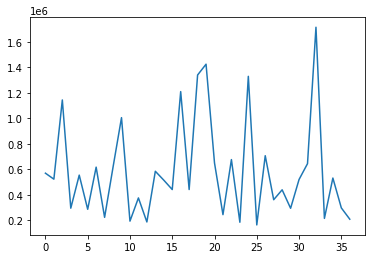

In [95]:
Employment['Total Unemployed'].plot(kind='line')

In [30]:
# download Nigeria's covid-19 geojson file
!wget -q -O '9ca1fdd1841543b7b079ba97e52df85a_0.geojson' https://opendata.arcgis.com/datasets/9ca1fdd1841543b7b079ba97e52df85a_0.geojson
print('Data downloaded!')

Data downloaded!


In [31]:
with open('9ca1fdd1841543b7b079ba97e52df85a_0.geojson') as json_data:
    Naija_data = json.load(json_data)

In [32]:
#exploring the geojson file
Covid_data = Naija_data['features']
Covid_data[5]

{'type': 'Feature',
 'properties': {'OBJECTID': 6,
  'CODE': 'NG006',
  'STATE': 'Bayelsa',
  'ADMIN_NAME': 'Bayelsa State',
  'GEO_ZONE': 'South South',
  'AREA_SQKM': 9546.42,
  'POP_2016': 2228965,
  'CENTER_Y': 4.766315328,
  'CENTER_X': 6.08041884,
  'CASES': 586,
  'DEATHS': 21,
  'RECOVERED': 532,
  'ACTIVE': 33,
  'NEW_CASES': 9,
  'NEW_DEATH': 0,
  'NEW_DISCHARGED': 0,
  'SCREENED': 7963},
 'geometry': {'type': 'Point',
  'coordinates': [6.08041884000005, 4.76631532800008]}}

## Extracting Data from the COVID JSON file

In [33]:
#initializing the dataframe for covid 19 data from the json file
column_names=['STATE','POP_2016','LATITUDE','LONGITUDE','AREA','CASES','DEATHS','RECOVERED','ACTIVE','SCREENED']

COVID19_data = pd.DataFrame(columns=column_names)

In [34]:
for data in Covid_data:
    state_name = data['properties']['STATE'] 
    population_2016 = data['properties']['POP_2016']
    state_lat = data['properties']['CENTER_Y']
    state_lon = data['properties']['CENTER_X']
    state_size = data['properties']['AREA_SQKM']
    state_cases = data['properties']['CASES']
    state_deaths = data['properties']['DEATHS']
    state_rec = data['properties']['RECOVERED']
    state_active = data['properties']['ACTIVE']
    state_tested = data['properties']['SCREENED']
    
    COVID19_data = COVID19_data.append({'STATE': state_name,
                                          'POP_2016': population_2016,
                                          'LATITUDE': state_lat,
                                          'LONGITUDE': state_lon,
                                          'AREA': state_size,
                                          'CASES': state_cases,
                                          'DEATHS': state_deaths,
                                          'RECOVERED': state_rec,
                                          'ACTIVE': state_active,
                                          'SCREENED': state_tested}, ignore_index=True)

In [35]:
COVID19_data=COVID19_data[0:37]
COVID19_data.head()

,STATE,POP_2016,LATITUDE,LONGITUDE,AREA,CASES,DEATHS,RECOVERED,ACTIVE,SCREENED
0,Abia,3644714,5.453302,7.523190,4858.88,1095,11,989,95,11552
1,Adamawa,4145684,9.323227,12.400241,37924.99,497,26,238,233,6150
2,Akwa Ibom,5353609,4.907245,7.846395,6723.20,553,9,394,150,4181
3,Anambra,5425334,6.222776,6.932186,4807.93,433,20,317,96,8534
4,Bauchi,6386388,10.796647,9.990588,48496.40,1100,17,953,130,12742


In [36]:
COVID19_data

,STATE,POP_2016,LATITUDE,LONGITUDE,AREA,CASES,DEATHS,RECOVERED,ACTIVE,SCREENED
0,Abia,3644714,5.453302,7.523190,4858.88,1095,11,989,95,11552
1,Adamawa,4145684,9.323227,12.400241,37924.99,497,26,238,233,6150
2,Akwa Ibom,5353609,4.907245,7.846395,6723.20,553,9,394,150,4181
3,Anambra,5425334,6.222776,6.932186,4807.93,433,20,317,96,8534
4,Bauchi,6386388,10.796647,9.990588,48496.40,1100,17,953,130,12742
5,Bayelsa,2228965,4.766315,6.080419,9546.42,586,21,532,33,7963
6,Benue,5568946,7.341086,8.751908,31462.23,629,15,512,102,7151
7,Borno,5669054,11.865243,13.098771,75949.95,844,36,738,70,15406
8,Cross River,3780419,5.845901,8.598756,21417.61,169,12,157,0,2272
9,Delta,5502806,5.704898,5.936930,17113.00,2031,52,1737,242,23828


In [37]:
COVID19_data.iloc[14, COVID19_data.columns.get_loc('STATE')] = 'Fct'  #change name of FCT to Fct to be consistent with other datasets
COVID19_data

,STATE,POP_2016,LATITUDE,LONGITUDE,AREA,CASES,DEATHS,RECOVERED,ACTIVE,SCREENED
0,Abia,3644714,5.453302,7.523190,4858.88,1095,11,989,95,11552
1,Adamawa,4145684,9.323227,12.400241,37924.99,497,26,238,233,6150
2,Akwa Ibom,5353609,4.907245,7.846395,6723.20,553,9,394,150,4181
3,Anambra,5425334,6.222776,6.932186,4807.93,433,20,317,96,8534
4,Bauchi,6386388,10.796647,9.990588,48496.40,1100,17,953,130,12742
5,Bayelsa,2228965,4.766315,6.080419,9546.42,586,21,532,33,7963
6,Benue,5568946,7.341086,8.751908,31462.23,629,15,512,102,7151
7,Borno,5669054,11.865243,13.098771,75949.95,844,36,738,70,15406
8,Cross River,3780419,5.845901,8.598756,21417.61,169,12,157,0,2272
9,Delta,5502806,5.704898,5.936930,17113.00,2031,52,1737,242,23828


In [41]:
COVID19_data.shape

(37, 10)

In [42]:
#checking for data types of columns
COVID19_data.dtypes

STATE         object
POP_2016      object
LATITUDE     float64
LONGITUDE    float64
AREA         float64
CASES         object
DEATHS        object
RECOVERED     object
ACTIVE        object
SCREENED      object
dtype: object

In [43]:
#changing datatype of integer columns to integers

COVID19_data[['POP_2016','AREA','CASES','DEATHS','RECOVERED','ACTIVE','SCREENED']] = COVID19_data[['POP_2016','AREA','CASES','DEATHS','RECOVERED','ACTIVE','SCREENED']].apply(pd.to_numeric) 
print(COVID19_data.dtypes)

STATE         object
POP_2016       int64
LATITUDE     float64
LONGITUDE    float64
AREA         float64
CASES          int64
DEATHS         int64
RECOVERED      int64
ACTIVE         int64
SCREENED       int64
dtype: object


In [44]:
# Downloading Nigeria Health-Access Data
!wget -q -O 'ceabba4071a64c0ca2420ee3656b37ae_0.geojson' https://opendata.arcgis.com/datasets/ceabba4071a64c0ca2420ee3656b37ae_0.geojson
print('Data downloaded!')

Data downloaded!


In [45]:
with open('ceabba4071a64c0ca2420ee3656b37ae_0.geojson') as json_data:
    Naija_data2 = json.load(json_data)

In [46]:
#exploring the geojson file
HealthAccess_data = Naija_data2['features']
HealthAccess_data[1]

{'type': 'Feature',
 'properties': {'OBJECTID': 2,
  'editor': 'abraham.oluseye',
  'statecode': 'AD',
  'statename': 'Adamawa',
  'capcity': 'Yola',
  'source': 'eHA_Polio',
  'timestamp': '2018/12/13 00:31:33+00',
  'globalid': '7d2a1c11-b5cb-45f3-b61e-7645aade9903',
  'geozone': 'NEZ',
  'id': 1075,
  'nga_accessibility_profile_ctg': 2.054538,
  'Shape__Area': 3.28726710847172,
  'Shape__Length': 12.1489915875901},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[12.20156948, 8.10679170700007],
    [12.2015180830001, 8.10679170700007],
    [12.199443817, 8.07416534400005],
    [12.201665878, 8.04249954200003],
    [12.209423192, 8.00343713100006],
    [12.2211303710001, 7.99450683600003],
    [12.218984768, 7.99125676100005],
    [12.2142944340001, 7.99029541000004],
    [12.2130737310001, 7.98748779300007],
    [12.2136265250001, 7.98245222200006],
    [12.2109038900001, 7.98293466300004],
    [12.2094051710001, 7.98124612100003],
    [12.2100082220001, 7.97738659700008],
    [

In [47]:
#initializing the dataframe for covid 19 data from the json file
column_names1=['STATE','HEALTH_ACCESS']

HealthAccess = pd.DataFrame(columns=column_names1)

In [48]:
for data in HealthAccess_data:
    state_name = data['properties']['statename'] 
    state_healthaccess = data['properties']['nga_accessibility_profile_ctg']
        
    HealthAccess = HealthAccess.append({'STATE': state_name,
                                          'HEALTH_ACCESS': state_healthaccess}, ignore_index=True)

In [49]:
HealthAccess = HealthAccess.sort_values('STATE').reset_index(drop=True)
HealthAccess

,STATE,HEALTH_ACCESS
0,Abia,1.957754
1,Adamawa,2.054538
2,Akwa Ibom,2.731196
3,Anambra,1.773679
4,Bauchi,1.816598
5,Bayelsa,3.681498
6,Benue,1.453632
7,Borno,2.682259
8,Cross River,1.390066
9,Delta,1.420864


In [50]:
#json file for choropleth map
naija_geo = 'ceabba4071a64c0ca2420ee3656b37ae_0.geojson' # geojson file

In [59]:
# create a map of Nigeria for covid-19 Screened
address = 'Nigeria'

geolocator = Nominatim(user_agent="Naij_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Nigeria are {}, {}.'.format(latitude, longitude))

#Create Nigeria Map
Naija_map = folium.Map(location=[latitude, longitude], zoom_start=6)

The geograpical coordinate of Nigeria are 9.6000359, 7.9999721.


In [60]:
# generate choropleth map for covid-19 Screening in Nigeria
Naija_map.choropleth(
    geo_data=naija_geo,
    data=COVID19_data,
    columns=['STATE', 'SCREENED'],
    key_on='properties.statename',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='COVID-19 Screening in Nigeria'
)

# display map
Naija_map

In [61]:
# create a map of Nigeria for covid-19 Cases
address = 'Nigeria'

geolocator = Nominatim(user_agent="Naij_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Nigeria are {}, {}.'.format(latitude, longitude))

#Create Nigeria Map
Naija_map1 = folium.Map(location=[latitude, longitude], zoom_start=6)

The geograpical coordinate of Nigeria are 9.6000359, 7.9999721.


In [62]:
# generate choropleth map for covid-19 cases in Nigeria
Naija_map1.choropleth(
    geo_data=naija_geo,
    data=COVID19_data,
    columns=['STATE', 'CASES'],
    key_on='properties.statename',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='COVID-19 Cases in Nigeria'
)

# display map
Naija_map1

In [63]:
# create a map of Nigeria for covid-19 DEATHS
address = 'Nigeria'

geolocator = Nominatim(user_agent="Naij_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Nigeria are {}, {}.'.format(latitude, longitude))

#Create Nigeria Map
Naija_map2 = folium.Map(location=[latitude, longitude], zoom_start=6)

The geograpical coordinate of Nigeria are 9.6000359, 7.9999721.


In [64]:
# generate choropleth map for covid-19 DEATHS in Nigeria
Naija_map2.choropleth(
    geo_data=naija_geo,
    data=COVID19_data,
    columns=['STATE', 'DEATHS'],
    key_on='properties.statename',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='COVID-19 Deaths in Nigeria'
)

# display map
Naija_map2

In [66]:
# create a map of Nigeria for Health Access
address = 'Nigeria'

geolocator = Nominatim(user_agent="Naij_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Nigeria are {}, {}.'.format(latitude, longitude))

#Create Nigeria Map
Naija_map3 = folium.Map(location=[latitude, longitude], zoom_start=6)

The geograpical coordinate of Nigeria are 9.6000359, 7.9999721.


In [67]:
# generate choropleth map for covid-19 DEATHS in Nigeria
Naija_map3.choropleth(
    geo_data=naija_geo,
    data=HealthAccess,
    columns=['STATE', 'HEALTH_ACCESS'],
    key_on='properties.statename',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Health Access Index in Nigeria'
)

# display map
Naija_map3

## USE OF FOURSQUARE

In [183]:
# The code was removed by Watson Studio for sharing.

'4bf58dd8d48988d104941735'

In [231]:
stateindex=30
COVID19_data.loc[stateindex,'STATE']

'Oyo'

In [232]:
state_latitude = COVID19_data.loc[stateindex, 'LATITUDE'] # neighborhood latitude value
state_longitude = COVID19_data.loc[stateindex, 'LONGITUDE'] # neighborhood longitude value

state_name = COVID19_data.loc[stateindex, 'STATE'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(state_name, 
                                                               state_latitude, 
                                                               state_longitude))

Latitude and longitude values of Oyo are 8.158826811, 3.612911627.


## Retrieve top 100 venues within 500ft from center of Lagos

In [233]:
radius=100000
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    state_latitude, 
    state_longitude, 
    radius, 
    LIMIT,
    categoryID)

url

'https://api.foursquare.com/v2/venues/explore?&client_id=EFEDMCWJ5W5AELBHW1SLSWMLFEF4RGVOJE2QNMJUJYBL5N0L&client_secret=GH2WQ51JE13OZZH2SFBR3CQVZOLVMCNIYSFVDVYLCQRA433V&v=20180605&ll=8.158826811,3.612911627&radius=100000&limit=100&categoryId=4bf58dd8d48988d104941735'

In [234]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '6004fc53ca6cb15547c2bda5'},
 'response': {'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'query': 'medical',
  'totalResults': 4,
  'suggestedBounds': {'ne': {'lat': 9.058827711000902,
    'lng': 4.520417470325662},
   'sw': {'lat': 7.258825910999101, 'lng': 2.7054057836743373}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4f3ebb66e4b0c15a623612b5',
       'name': 'LAUTECH TEACHING HOSPITAL',
       'location': {'lat': 8.151198125069424,
        'lng': 4.253131489173393,
        'labeledLatLngs': [{'label': 'display',
          'lat': 8.151198125069424,
          'lng': 4.253131489173393}],
        'distance': 70552,
        'cc': 'NG',
        'country

In [235]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [236]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

#nearby_venues.head()
nearby_venues

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  app.launch_new_instance()


,name,categories,lat,lng
0,LAUTECH TEACHING HOSPITAL,Hospital,8.151198,4.253131
1,University college hospital,Medical School,7.402112,3.903600
2,Adeoyo State Hospital,Hospital,7.353948,3.860731
3,St Dominic Chatholic Hospital,Hospital,7.391763,4.011507


In [172]:
nearby_venues.shape

(5, 5)

In [237]:
#defining function for multiple states
def getNearbyVenues(names, latitudes, longitudes, radius=100000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT,
            categoryID)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['STATE', 
                  'STATE Latitude', 
                  'STATE Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [238]:
Medical_facilities = getNearbyVenues(names=COVID19_data['STATE'],
                                   latitudes=COVID19_data['LATITUDE'],
                                   longitudes=COVID19_data['LONGITUDE']
                                  )

Abia
Adamawa
Akwa Ibom
Anambra
Bauchi
Bayelsa
Benue
Borno
Cross River
Delta
Ebonyi
Edo
Ekiti
Enugu
Fct
Gombe
Imo
Jigawa
Kaduna
Kano
Katsina
Kebbi
Kogi
Kwara
Lagos
Nasarawa
Niger
Ogun
Ondo
Osun
Oyo
Plateau
Rivers
Sokoto
Taraba
Yobe
Zamfara


In [239]:
print(Medical_facilities.shape)
Medical_facilities

(317, 7)


,STATE,STATE Latitude,STATE Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abia,5.453302,7.523190,Pearl Medical Centre,4.797574,7.000609,Medical Center
1,Abia,5.453302,7.523190,First Rivers Hospital LTD,4.836318,7.022918,Hospital
2,Abia,5.453302,7.523190,University Of Port Harcourt Teaching Hospital,4.897946,6.929785,Hospital
3,Abia,5.453302,7.523190,Garden City Clinic,4.799456,7.003838,Hospital
4,Abia,5.453302,7.523190,Meridian Hospitals,4.803736,6.996882,Hospital
...,...,...,...,...,...,...,...
312,Sokoto,13.037993,5.318810,State Veterinary Clinic,13.060307,5.225605,Veterinarian
313,Sokoto,13.037993,5.318810,State Veterinary Clinic,13.068910,5.214330,Veterinarian
314,Taraba,8.023131,10.786479,Ereğli Devlet Hastanesi Odyoloji Ünitesi,7.388268,10.157113,Medical Center
315,Yobe,12.376215,11.393266,Potiskum Genral Hospital,11.722001,11.068503,Hospital


In [240]:
Medical_facilities.groupby('STATE').count()

,STATE Latitude,STATE Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
STATE,,,,,,
Abia,5,5,5,5,5,5
Adamawa,7,7,7,7,7,7
Akwa Ibom,4,4,4,4,4,4
Anambra,35,35,35,35,35,35
Bauchi,8,8,8,8,8,8
Bayelsa,1,1,1,1,1,1
Benue,11,11,11,11,11,11
Borno,3,3,3,3,3,3
Delta,7,7,7,7,7,7
